### Explanatory Data Analysis on UR3 CobotOPs Dataset

Importing Libraries and Loading Dataset

In [1]:
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

from pathlib import Path
PLOTS_DIR = Path('../plots')
PLOTS_DIR.mkdir(exist_ok=True, parents=True)

import warnings; warnings.filterwarnings('ignore')


data = pd.read_excel('../data/UR3_CobotOps.xlsx')

In [2]:
data.head(15)

,Num,Timestamp,Current_J0,Temperature_T0,Current_J1,Temperature_J1,Current_J2,Temperature_J2,Current_J3,Temperature_J3,...,Speed_J0,Speed_J1,Speed_J2,Speed_J3,Speed_J4,Speed_J5,Tool_current,cycle,Robot_ProtectiveStop,grip_lost
0,1,2022-10-26T08:17:21.847Z,0.109628,27.8750,-2.024669,29.3750,-1.531442,29.3750,-0.998570,32.1250,...,2.955651e-01,-0.000490,0.001310,-1.328356e-01,-7.478529e-03,-1.529622e-01,0.082732,1,0.0,False
1,2,2022-10-26T08:17:22.852Z,0.595605,27.8750,-2.278456,29.3125,-0.866556,29.4375,-0.206097,32.1875,...,-7.391485e-30,-0.000304,0.002185,1.668227e-03,-7.668273e-04,4.169016e-04,0.505895,1,0.0,False
2,3,2022-10-26T08:17:23.857Z,-0.229474,27.8750,-2.800408,29.3125,-2.304336,29.4375,-0.351499,32.1250,...,1.369386e-01,0.007795,-2.535874,3.798670e-01,4.545622e-04,-4.968559e-01,0.079420,1,0.0,False
3,4,2022-10-26T08:17:24.863Z,0.065053,27.8750,-3.687768,29.3125,-1.217652,29.4375,-1.209115,32.1250,...,-9.030032e-02,-0.004911,-0.009096,-3.841961e-01,1.841084e-02,4.255591e-01,0.083325,1,0.0,False
4,5,2022-10-26T08:17:25.877Z,0.884140,27.8750,-2.938830,29.3750,-1.794076,29.4375,-2.356471,32.1875,...,1.268088e-01,0.005567,0.001138,-3.532840e-01,1.499380e-02,1.809886e-01,0.086379,1,0.0,False
5,6,2022-10-26T08:17:26.885Z,0.118961,27.8125,-2.162542,29.3750,-1.211779,29.4375,-0.481834,32.1875,...,-4.639511e-05,0.000093,0.000262,2.170784e-03,2.647067e-04,-2.470161e-03,0.188310,1,0.0,False
6,7,2022-10-26T08:17:27.901Z,0.086138,27.8750,-1.757647,29.3750,-0.960634,29.4375,-0.488380,32.1875,...,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,1.121039e-44,0.085192,1,0.0,False
7,8,2022-10-26T08:17:28.903Z,0.075657,27.8750,-1.836465,29.3750,-0.961322,29.4375,-0.512541,32.1875,...,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.087058,1,0.0,False
8,9,2022-10-26T08:17:29.905Z,-0.186848,27.8750,-2.563738,29.3750,-1.418934,29.4375,-0.262015,32.1875,...,-1.660036e-01,0.002409,-0.015483,3.500632e-01,-9.985541e-03,-1.927102e-01,0.085785,1,0.0,False
9,10,2022-10-26T08:17:30.909Z,-0.158912,27.8750,-1.750777,29.3750,-1.979400,29.4375,-0.184550,32.1875,...,9.832304e-02,0.004996,-0.016996,4.962411e-01,-1.735275e-02,-5.886860e-01,0.085020,1,0.0,False


In [3]:
print(f'\n ===== Shape of Dataset ===== \n {data.shape}')
print(f'\n ===== Handling Missing Values ===== \n {data.isnull().sum().sort_values(ascending=False)}')
print(f'\n ===== Handling Duplicate Observations =====  \n {data.duplicated().sum()}')
print(f'\n ===== Checking Datatypes =====  \n  {data.dtypes}')
print(f'\n ===== Summary Statistics ===== \n {data.describe()}')


 ===== Shape of Dataset ===== 
 (7409, 24)

 ===== Handling Missing Values ===== 
 Temperature_T0          54
Current_J2              54
Temperature_J1          54
Current_J1              54
Temperature_J2          54
Current_J4              54
Temperature_J3          54
Current_J3              54
Speed_J2                54
Speed_J3                54
Speed_J4                54
Temperature_J4          54
Current_J5              54
Temperature_J5          54
Speed_J0                54
Speed_J1                54
Tool_current            54
Robot_ProtectiveStop    54
Speed_J5                54
Current_J0              46
Timestamp                0
Num                      0
cycle                    0
grip_lost                0
dtype: int64

 ===== Handling Duplicate Observations =====  
 0

 ===== Checking Datatypes =====  
  Num                       int64
Timestamp                object
Current_J0              float64
Temperature_T0          float64
Current_J1              float64
Tempera

handling whitespace error in `cycle `  column name

In [4]:
data['cycle'] = data['cycle '].replace(' ', '')

histogram cycle distribution plot

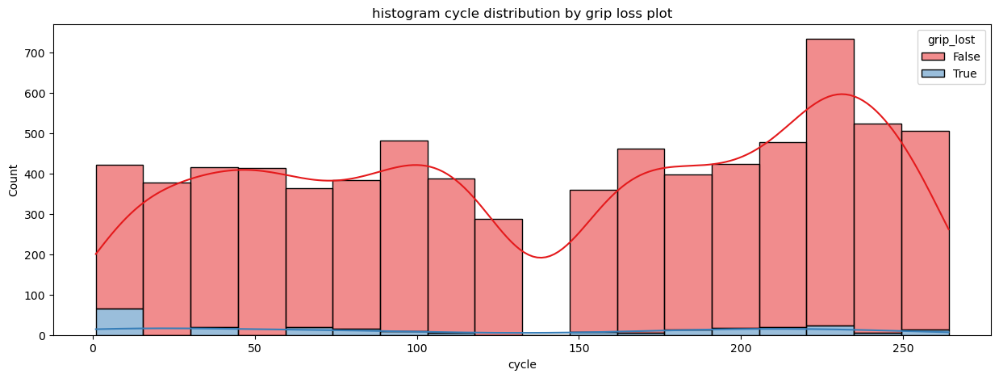

In [5]:
plt.figure(figsize=(15, 5))

sns.histplot(data,
             x='cycle',
             hue='grip_lost',
             palette='Set1',
             multiple='stack',
             kde=True
)

plt.title('histogram cycle distribution by grip loss plot')
plt.xlabel('cycle')
plt.show()

piechart distribution on grip loss

In [6]:
protective_stop_count = data['Robot_ProtectiveStop'].value_counts()
print(protective_stop_count)

Robot_ProtectiveStop
0.0    7077
1.0     278
Name: count, dtype: int64


In [7]:
labels = protective_stop_count.index
values = protective_stop_count.values

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=0.3)])
fig.update_layout(title_text='Robot Protective Stop Distribution')
fig.update_traces(textinfo='percent+label')
fig.show()

piechart distribution on grip lost

In [8]:
grip_loss_count = data['grip_lost'].value_counts()
print(grip_loss_count)

grip_lost
False    7166
True      243
Name: count, dtype: int64


In [9]:
labels = grip_loss_count.index
values = grip_loss_count.values

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=0.3)])
fig.update_layout(title_text = 'Grip Loss Distribution')
fig.update_traces(textinfo='percent+label')
fig.show()

pairplot distribution

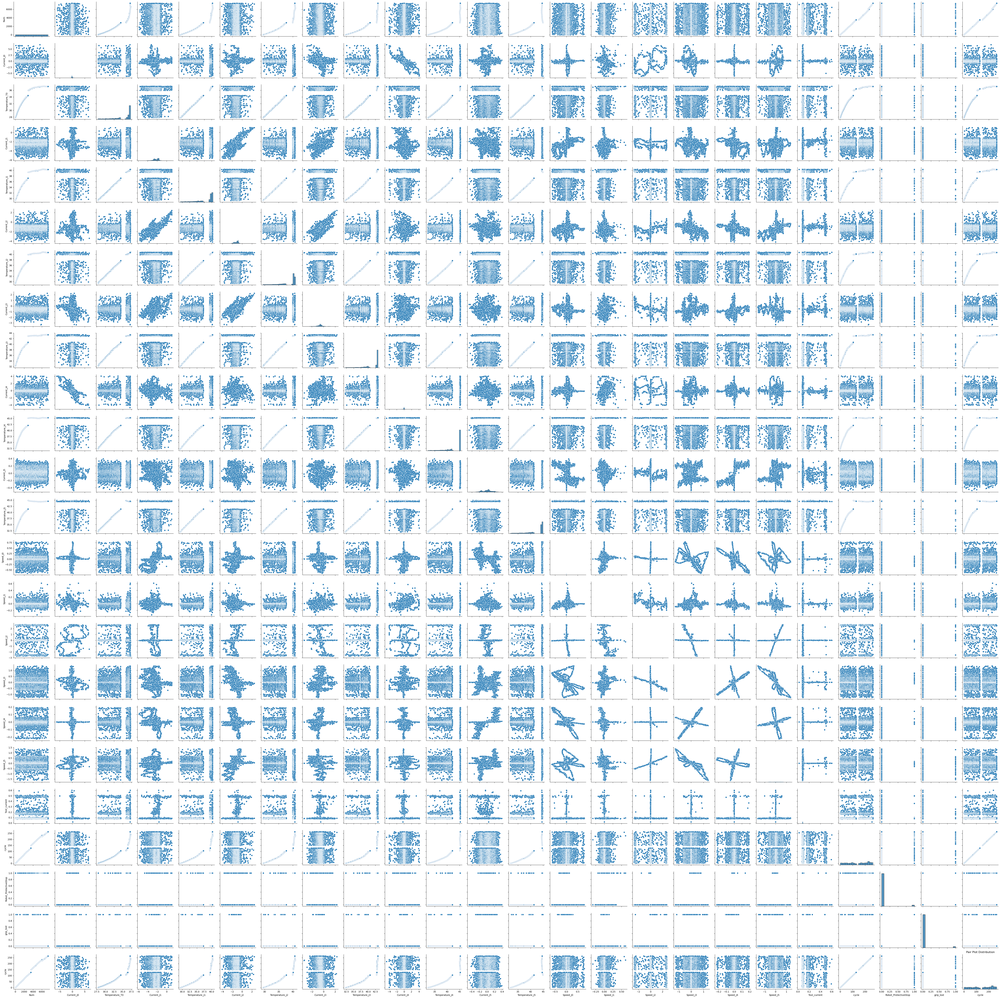

In [ ]:
sns.pairplot(data)
plt.show()
plt.savefig(PLOTS_DIR / 'pairplot_distribution.png')
plt.close()